In [1]:
import os
import torch
from torch import nn
from torch.nn import functional as F
from torch import optim
from torch.utils.data import DataLoader, sampler
from torchvision import transforms as T
from torchvision import models

from PIL import Image

from matplotlib import pyplot as plt
%matplotlib inline

from datetime import datetime

from usns_v3_utils import *
from usns_v3_models import *

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
DATA_PATH = 'data/'
TRAIN_PATH = os.path.join(DATA_PATH, 'train')
TEST_PATH = os.path.join(DATA_PATH, 'test')
MODEL_PATH = 'models/'
SUBMS_PATH = 'submissions/'


if torch.cuda.is_available():
    device = torch.device('cuda')
    dtype = torch.cuda.FloatTensor
else:
    device = torch.device('cpu')
    dtype = torch.FloatTensor

In [4]:
model_input_size = (256, 256)
img_mean = (0.38983212684516944,)
img_std = (0.21706658034222048,)

transform = T.Compose([
    Resize(model_input_size),
    RandomVerticalFlip(0.5),
    RandomHorizontalFlip(0.5),
    ToTensor(),
    Normalize(mean=img_mean, std=img_std)
])

transform_val = T.Compose([
    Resize(model_input_size),
    ToTensor(),
    Normalize(mean=img_mean, std=img_std)
])

Splitting dataset to train and validation sets

Random state '0' seems to be one of the best for val set balance compared with public test set

In [5]:
# NB!: there are only 47 patients in trainig dataset.
params_split = {
    'test_size': 0.1,
    'random_state': 0
}

# Full trainig dataset
imglist_full_train, imglist_full_val = train_val_split(TRAIN_PATH, **params_split)

# List of labeled images from dataset
imglist_labeled = get_labeled(TRAIN_PATH)

imglist_labeled_train = list(set(imglist_full_train) & set(imglist_labeled))
imglist_labeled_val = list(set(imglist_full_val) & set(imglist_labeled))

In [6]:
# auxiliary function creating dataset with given images and transform
def trainset(imglist, transform):
    """Returns trainig USNSDataset containing images from imglist
        imglist: list of images (without masks) to include in returned dataset
        transform: transforms to apply
    """
    return USNSDataset(TRAIN_PATH, imglist, train=True, transform=transform)

In [7]:
params = {'batch_size': 8}

# Data loaders
loader_full_train = DataLoader(
    trainset(imglist_full_train, transform),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)
loader_full_val = DataLoader(
    trainset(imglist_full_val, transform_val),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

# Labled data loaders
loader_labeled_train = DataLoader(
    trainset(imglist_labeled_train, transform),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)
loader_labeled_val = DataLoader(
    trainset(imglist_labeled_val, transform_val),
    batch_size=params['batch_size'],
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

The set contains 5036 images. Portion of empty masks: 0.5935266084193804
The set contains 599 images. Portion of empty masks: 0.5392320534223707
The set contains 2047 images. Portion of empty masks: 0.0
The set contains 276 images. Portion of empty masks: 0.0


In [8]:
params_unet = {
    'depth': 5,
    'n_filters': 32,
    'bn': True
}

unet = UnetD(**params_unet)
unet = unet.to(device=device);

detector = USNSDetector(unet, device)

General train with cross entropy optimization

Optimization with cross_entropy loss function
2000 images processed, loss = 0.11404065549373626
Validation loss = 0.0445990043759147
Val Dice score = 0.4063747227191925

4000 images processed, loss = 0.035811019219458104
Validation loss = 0.034983207311524774
Val Dice score = 0.4748123288154602

After 1 epochs: loss = 0.006574287000123332
Validation loss = 0.04632389303514476
Val Dice score = 0.3844369649887085


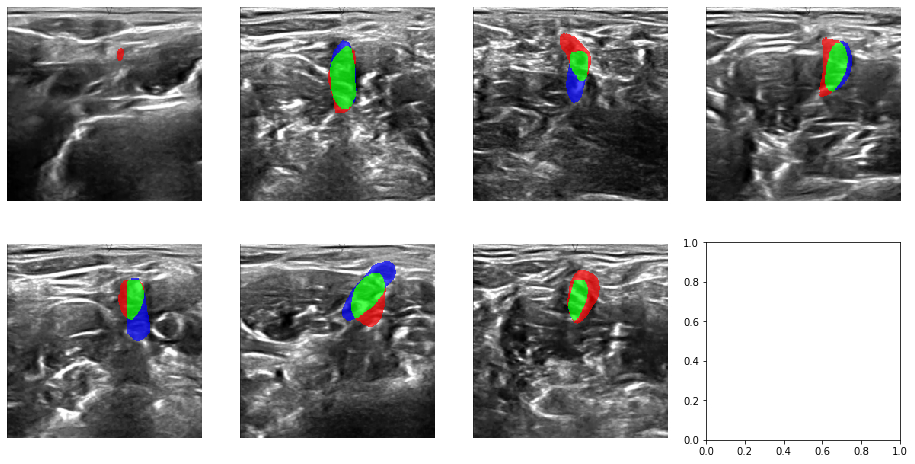


6004 images processed, loss = 0.03204614653841345
Validation loss = 0.04228034321349332
Val Dice score = 0.45503148436546326

8004 images processed, loss = 0.02835508194565773
Validation loss = 0.03127658923151895
Val Dice score = 0.5167725682258606

10004 images processed, loss = 0.027505694385617972
Validation loss = 0.030841933016063573
Val Dice score = 0.5644401907920837

After 2 epochs: loss = 0.00018611676159527115
Validation loss = 0.029923100801859556
Val Dice score = 0.5546097755432129


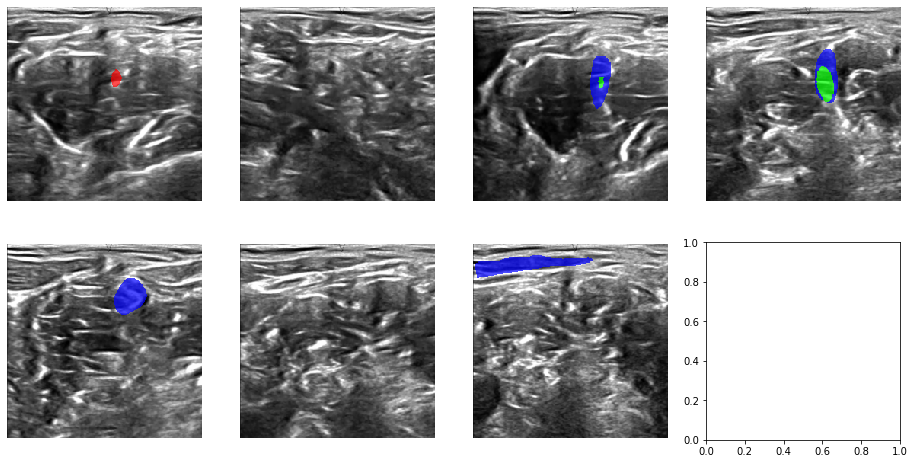


12000 images processed, loss = 0.025260146767020465
Validation loss = 0.029686769881038515
Val Dice score = 0.5676940083503723

14000 images processed, loss = 0.02823977354168892
Validation loss = 0.03113431560935978
Val Dice score = 0.5623327493667603

After 3 epochs: loss = 0.001932439606105142
Validation loss = 0.02978590961377788
Val Dice score = 0.5423249006271362


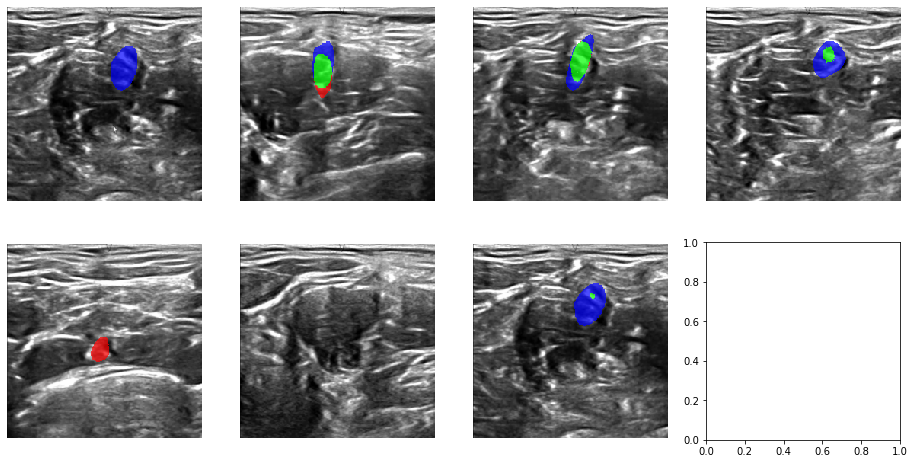


16004 images processed, loss = 0.0259389051063332
Validation loss = 0.029444442900249078
Val Dice score = 0.5388898253440857

18004 images processed, loss = 0.02474673118069768
Validation loss = 0.029192560472104306
Val Dice score = 0.5712975263595581

20004 images processed, loss = 0.024774322718381883
Validation loss = 0.032316474805279743
Val Dice score = 0.5589410662651062

After 4 epochs: loss = 0.00018493939861300164
Validation loss = 0.030627245192286965
Val Dice score = 0.5721529722213745


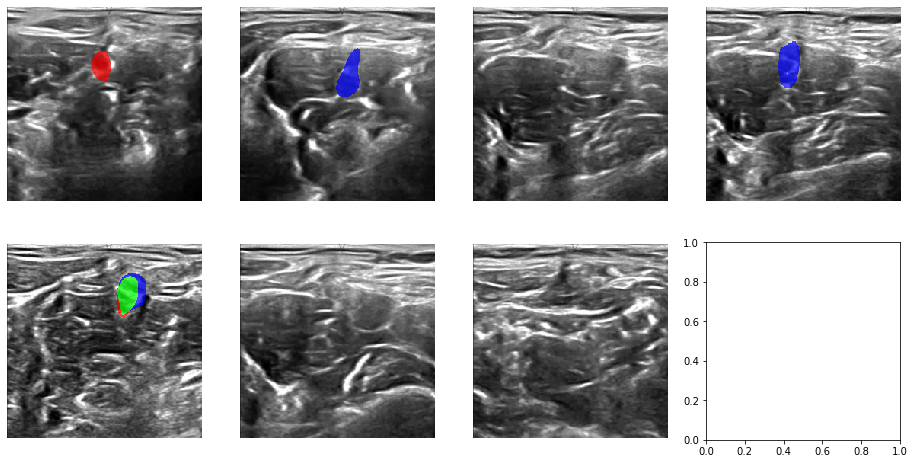


22000 images processed, loss = 0.025254239923580137
Validation loss = 0.030081875927012433
Val Dice score = 0.5603693723678589

24000 images processed, loss = 0.02450975286029279
Validation loss = 0.02888119416015972
Val Dice score = 0.5718985199928284

After 5 epochs: loss = 0.001090105437186145
Validation loss = 0.027737704586107068
Val Dice score = 0.5363186597824097


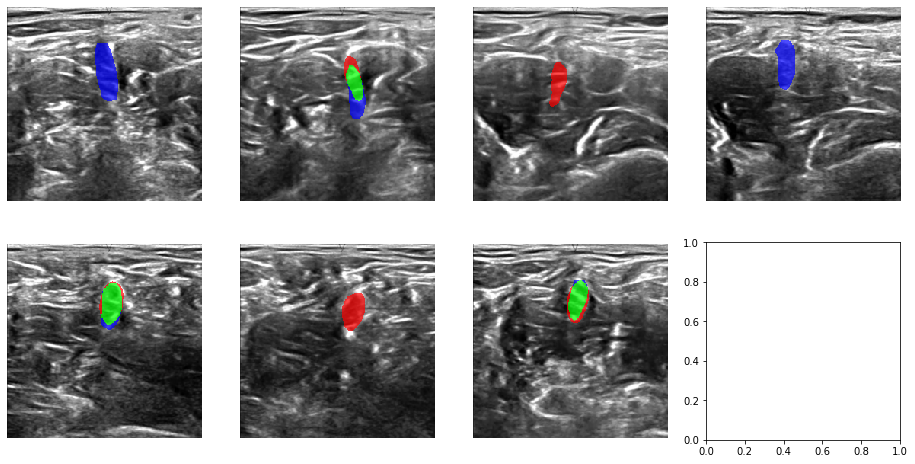


26004 images processed, loss = 0.02319561050992883
Validation loss = 0.0286220235249435
Val Dice score = 0.5830932855606079

28004 images processed, loss = 0.02405837625823915
Validation loss = 0.03057360243929149
Val Dice score = 0.5887686014175415

30004 images processed, loss = 0.024619018983095885
Validation loss = 0.030397791415452957
Val Dice score = 0.5746471285820007

After 6 epochs: loss = 0.00016443182432938734
Validation loss = 0.026370274633766216
Val Dice score = 0.5999160408973694


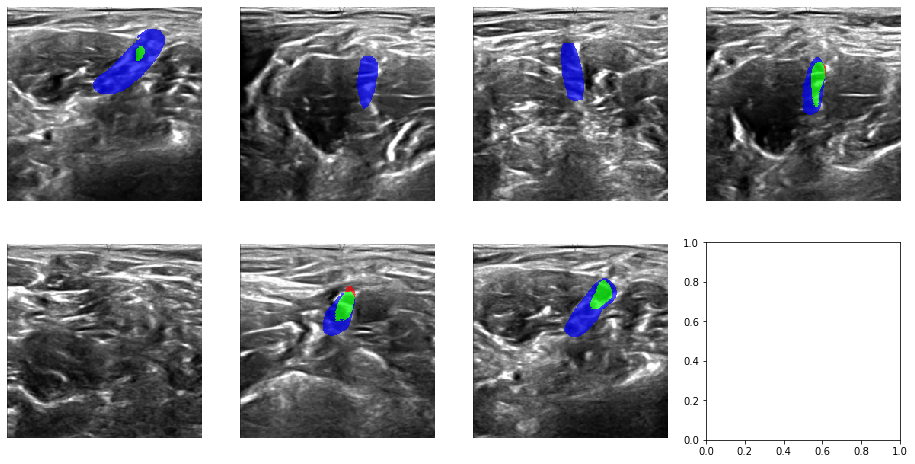


32000 images processed, loss = 0.023949115762938716
Validation loss = 0.026927280079616926
Val Dice score = 0.552649736404419

34000 images processed, loss = 0.023547391328960658
Validation loss = 0.027623394333161973
Val Dice score = 0.5458105206489563

After 7 epochs: loss = 0.0007936527304123915
Validation loss = 0.02777320388486867
Val Dice score = 0.5875334143638611


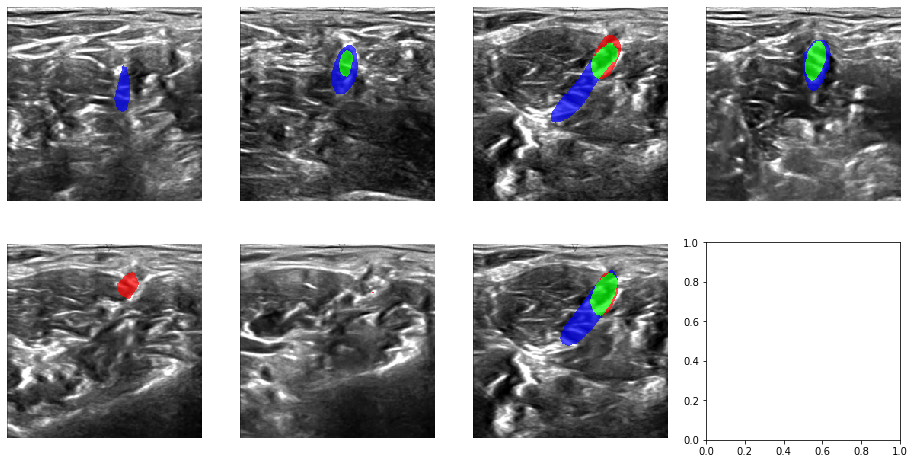


36004 images processed, loss = 0.02262239933326216
Validation loss = 0.028974670985206737
Val Dice score = 0.5333911776542664

38004 images processed, loss = 0.0228381524682045
Validation loss = 0.028586967884001627
Val Dice score = 0.5487099885940552

40004 images processed, loss = 0.02324361351504922
Validation loss = 0.027764009638302313
Val Dice score = 0.5973199009895325

After 8 epochs: loss = 0.00016035734804538008
Validation loss = 0.029621164909935556
Val Dice score = 0.5726195573806763


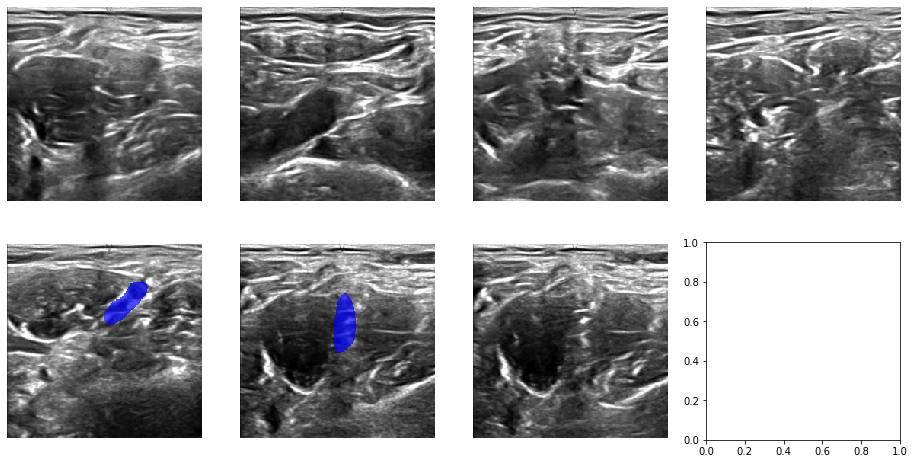


42000 images processed, loss = 0.023129934430092515
Validation loss = 0.026738818172048248
Val Dice score = 0.5753272771835327

44000 images processed, loss = 0.022402333110570907
Validation loss = 0.030358164992575255
Val Dice score = 0.6035192608833313

After 9 epochs: loss = 0.0006669789887047458
Validation loss = 0.028911708628693487
Val Dice score = 0.5739515423774719


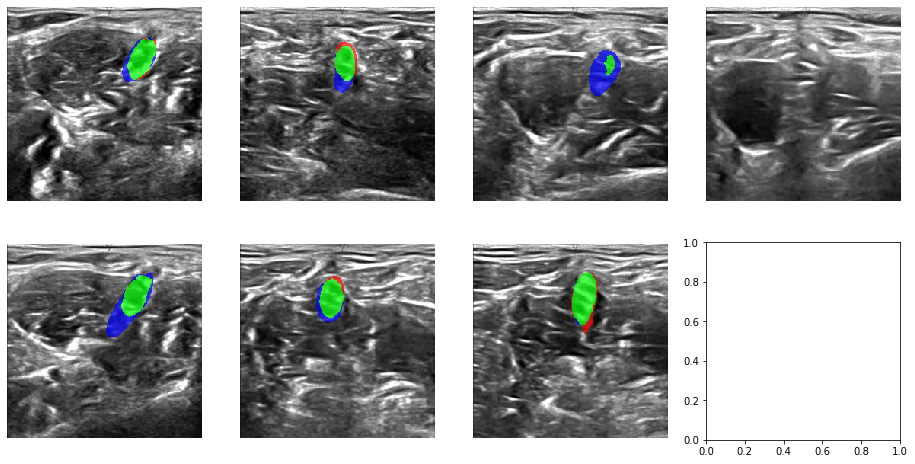


46004 images processed, loss = 0.022630900159448446
Validation loss = 0.026212841856957277
Val Dice score = 0.600715696811676

48004 images processed, loss = 0.022673195838928222
Validation loss = 0.02832874530096086
Val Dice score = 0.5716960430145264

50004 images processed, loss = 0.022421680431813
Validation loss = 0.026050776768730757
Val Dice score = 0.5999314188957214

After 10 epochs: loss = 0.00016362496494146166
Validation loss = 0.027773192789847145
Val Dice score = 0.6045295596122742


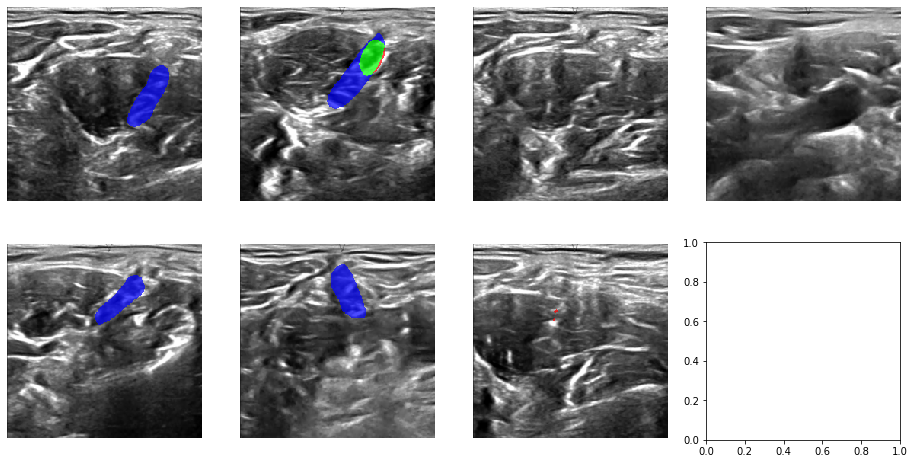


52000 images processed, loss = 0.0227412951901137
Validation loss = 0.02972153619939278
Val Dice score = 0.5493893027305603

54000 images processed, loss = 0.021828308191150426
Validation loss = 0.025417246310062123
Val Dice score = 0.5860234498977661

After 11 epochs: loss = 0.0005571303215461291
Validation loss = 0.025339445839317295
Val Dice score = 0.5987720489501953


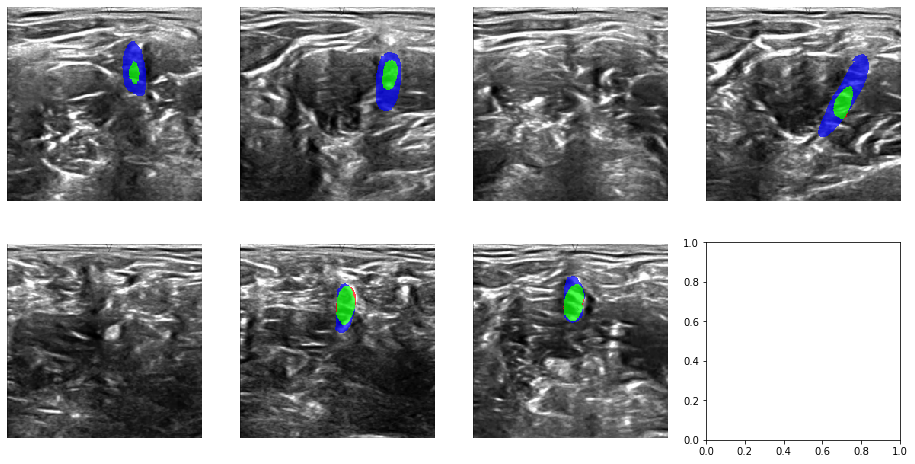


56004 images processed, loss = 0.0219358613606758
Validation loss = 0.026757864396590024
Val Dice score = 0.595729410648346

58004 images processed, loss = 0.02269120281562209
Validation loss = 0.029462507246481955
Val Dice score = 0.5987808704376221

60004 images processed, loss = 0.021498767806217074
Validation loss = 0.025342900937233424
Val Dice score = 0.5932971239089966

After 12 epochs: loss = 0.00015469997870245876
Validation loss = 0.025855322230066202
Val Dice score = 0.5871294140815735


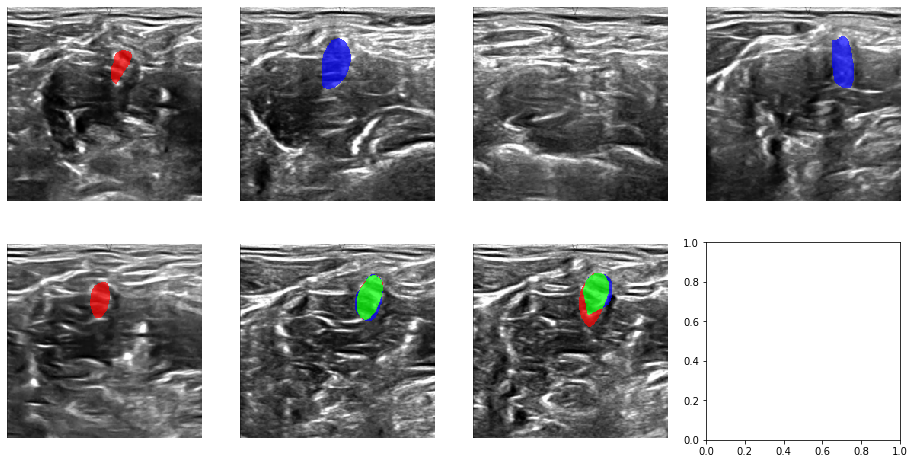


62000 images processed, loss = 0.021255975288669307
Validation loss = 0.028497429479081463
Val Dice score = 0.6063161492347717

64000 images processed, loss = 0.021549309866502882
Validation loss = 0.02611628501288879
Val Dice score = 0.6022675037384033

After 13 epochs: loss = 0.0005069566802853749
Validation loss = 0.02699377481671725
Val Dice score = 0.6236405968666077


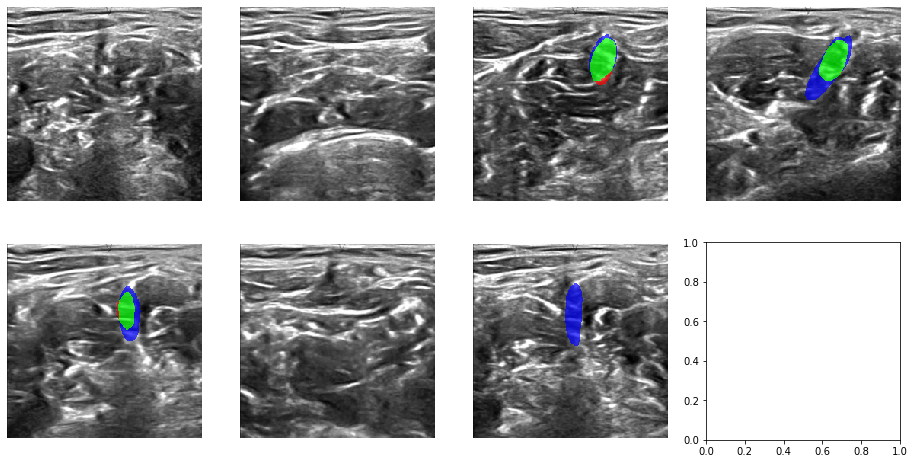


66004 images processed, loss = 0.022292003883216196
Validation loss = 0.02710255310063768
Val Dice score = 0.6101136207580566

68004 images processed, loss = 0.021206448353826998
Validation loss = 0.02674759179975632
Val Dice score = 0.6234444379806519

70004 images processed, loss = 0.021459782307967544
Validation loss = 0.02566786471735655
Val Dice score = 0.6019740700721741

After 14 epochs: loss = 0.00015917345362592944
Validation loss = 0.027028049878738757
Val Dice score = 0.6057515144348145


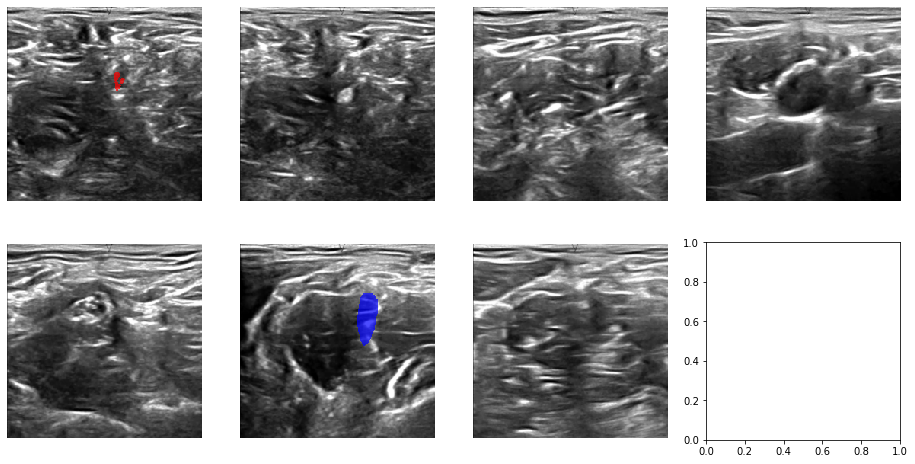


72000 images processed, loss = 0.0217738257896506
Validation loss = 0.025330904572704597
Val Dice score = 0.605360746383667

74000 images processed, loss = 0.021257274394854902
Validation loss = 0.02723059839629669
Val Dice score = 0.6154561042785645

After 15 epochs: loss = 0.00042043898071179414
Validation loss = 0.028563136520961888
Val Dice score = 0.604446291923523


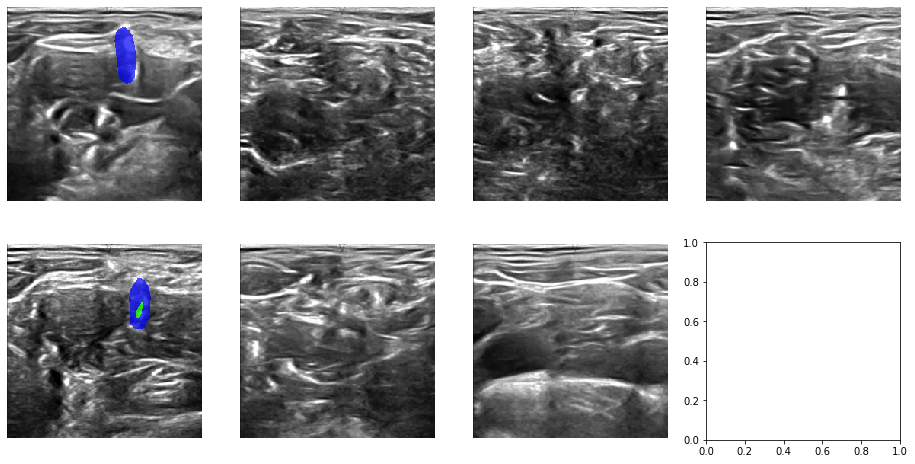


76004 images processed, loss = 0.020319561239800412
Validation loss = 0.027754448229860583
Val Dice score = 0.6436648368835449

78004 images processed, loss = 0.02164220320433378
Validation loss = 0.027860055085215624
Val Dice score = 0.623707115650177

80004 images processed, loss = 0.019834136473014952
Validation loss = 0.025571002436798683
Val Dice score = 0.636702299118042

After 16 epochs: loss = 0.00014911392228189645
Validation loss = 0.02755716607248246
Val Dice score = 0.6187574863433838


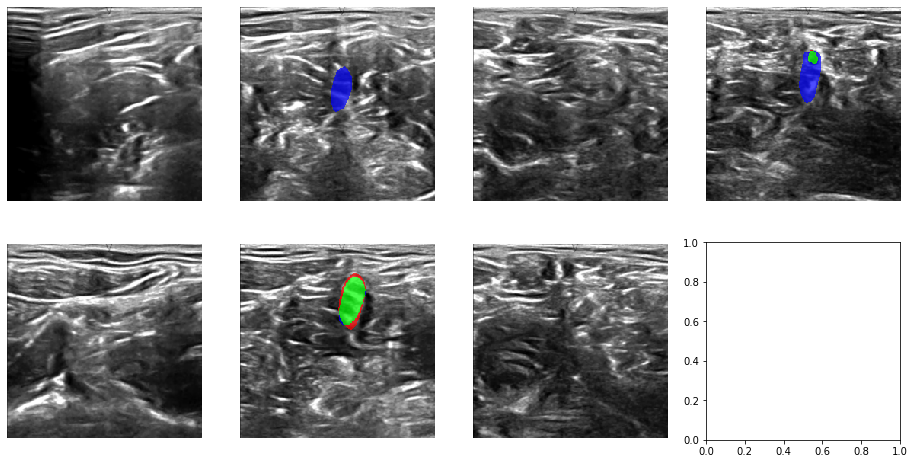


82000 images processed, loss = 0.02065948271127287
Validation loss = 0.02637874325721809
Val Dice score = 0.6318367123603821

84000 images processed, loss = 0.02105614128522575
Validation loss = 0.02664585788431072
Val Dice score = 0.6274315118789673

After 17 epochs: loss = 0.0003748815743846074
Validation loss = 0.0307383846790096
Val Dice score = 0.5856983065605164


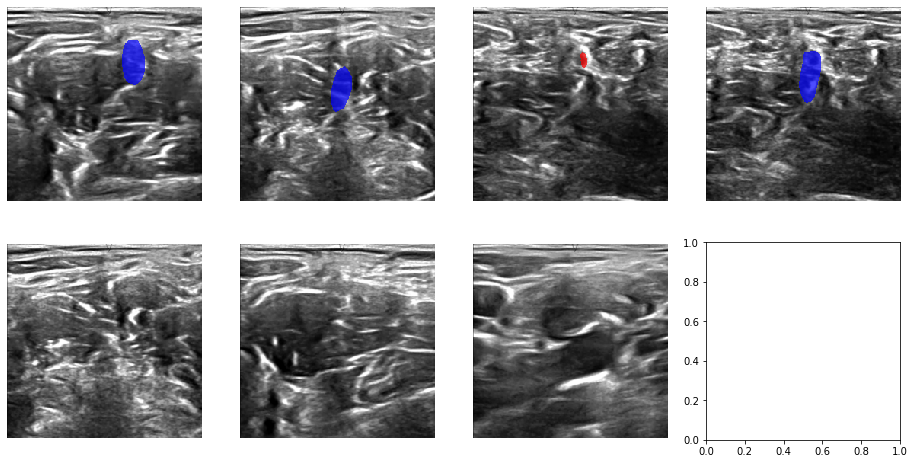


86004 images processed, loss = 0.019987496268561857
Validation loss = 0.026380833092212477
Val Dice score = 0.6396970748901367

88004 images processed, loss = 0.019441727928817272
Validation loss = 0.03511956158111211
Val Dice score = 0.5673308968544006

90004 images processed, loss = 0.02114666379801929
Validation loss = 0.027622065648361917
Val Dice score = 0.5998402833938599

After 18 epochs: loss = 0.000140295631663438
Validation loss = 0.026524770569572465
Val Dice score = 0.5856533646583557


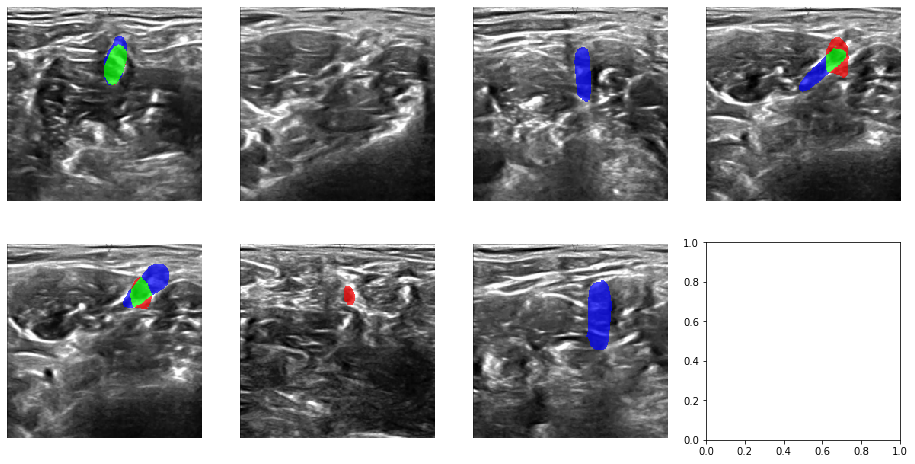


92000 images processed, loss = 0.020060778885728908
Validation loss = 0.028416600034810068
Val Dice score = 0.6020083427429199

94000 images processed, loss = 0.02027868978306651
Validation loss = 0.030185104604306724
Val Dice score = 0.5510604381561279

After 19 epochs: loss = 0.0003523085600827359
Validation loss = 0.025102963630663534
Val Dice score = 0.6476334929466248


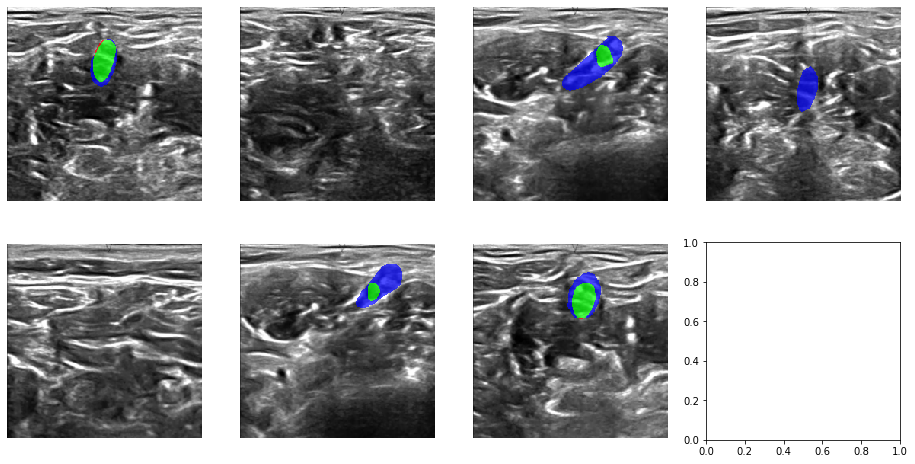


96004 images processed, loss = 0.01985436236530453
Validation loss = 0.027686695333489393
Val Dice score = 0.642185389995575

98004 images processed, loss = 0.020076290918514133
Validation loss = 0.026042619716991764
Val Dice score = 0.6426301002502441

100004 images processed, loss = 0.019451177173294126
Validation loss = 0.02557152489166029
Val Dice score = 0.6414522528648376

After 20 epochs: loss = 0.00014231248497607882
Validation loss = 0.02733357164243824
Val Dice score = 0.6243314743041992


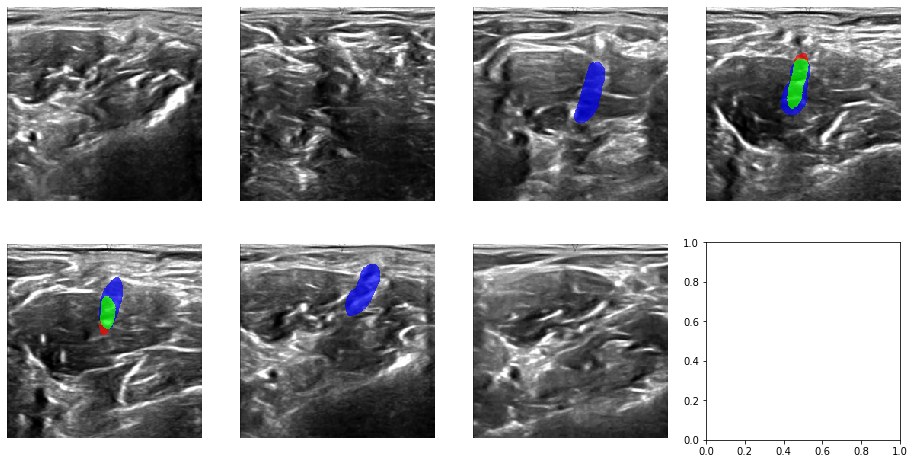


102000 images processed, loss = 0.01884915741283693
Validation loss = 0.02875892182529122
Val Dice score = 0.6174066662788391

104000 images processed, loss = 0.01946667339466512
Validation loss = 0.026600550033015282
Val Dice score = 0.6507524251937866

After 21 epochs: loss = 0.0003389912060053289
Validation loss = 0.026299455776835522
Val Dice score = 0.6396368741989136


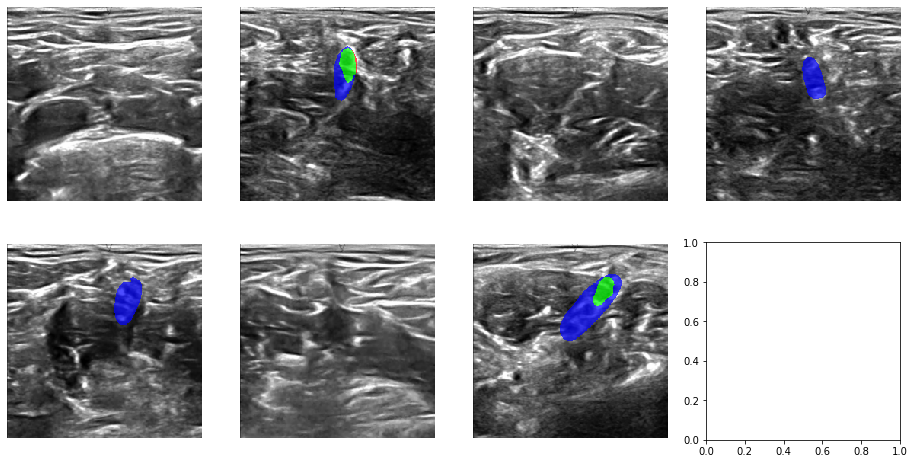


106004 images processed, loss = 0.020894038661972373
Validation loss = 0.026185197569118916
Val Dice score = 0.6447027325630188

108004 images processed, loss = 0.019317016417160632
Validation loss = 0.03094452814834942
Val Dice score = 0.6072517037391663

110004 images processed, loss = 0.01861449597775936
Validation loss = 0.025184151099276464
Val Dice score = 0.6516851782798767

After 22 epochs: loss = 0.00014271513281255709
Validation loss = 0.03057800056428364
Val Dice score = 0.6181738376617432


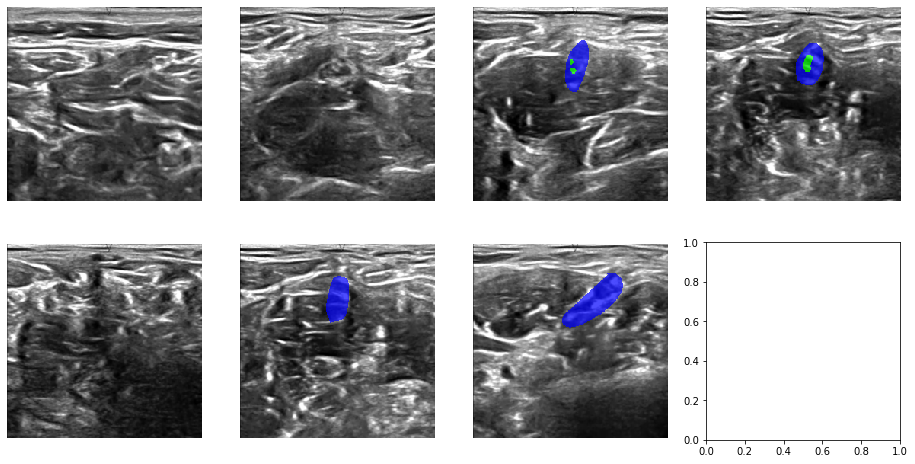


112000 images processed, loss = 0.020168472850370503
Validation loss = 0.02989908514267614
Val Dice score = 0.5857572555541992

114000 images processed, loss = 0.018540867509320377
Validation loss = 0.02773403958456345
Val Dice score = 0.6367018818855286

After 23 epochs: loss = 0.0003059289734508909
Validation loss = 0.026340143605817937
Val Dice score = 0.6275712251663208


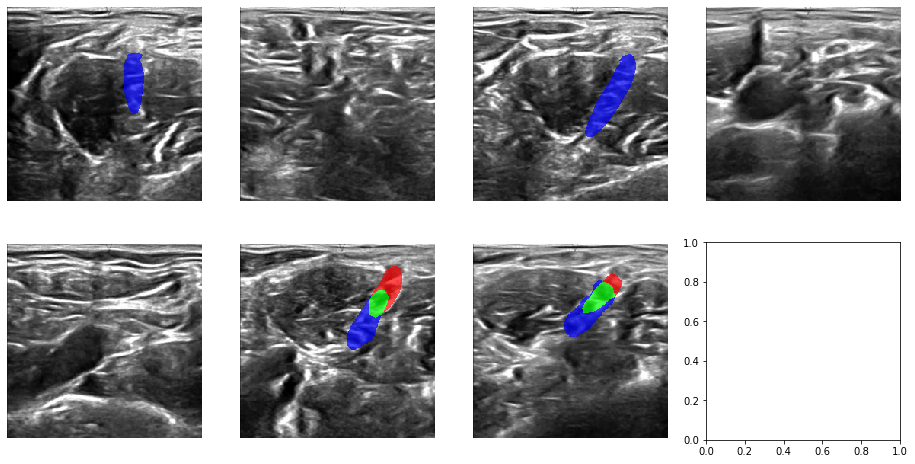


116004 images processed, loss = 0.019496796949173577
Validation loss = 0.024843430885102893
Val Dice score = 0.6433017253875732

118004 images processed, loss = 0.018698050785809755
Validation loss = 0.027979636589727536
Val Dice score = 0.6519176363945007

120004 images processed, loss = 0.018904885390773417
Validation loss = 0.025067174754327844
Val Dice score = 0.6367254257202148

After 24 epochs: loss = 0.00013549384169220363
Validation loss = 0.0248145548524164
Val Dice score = 0.6350361108779907


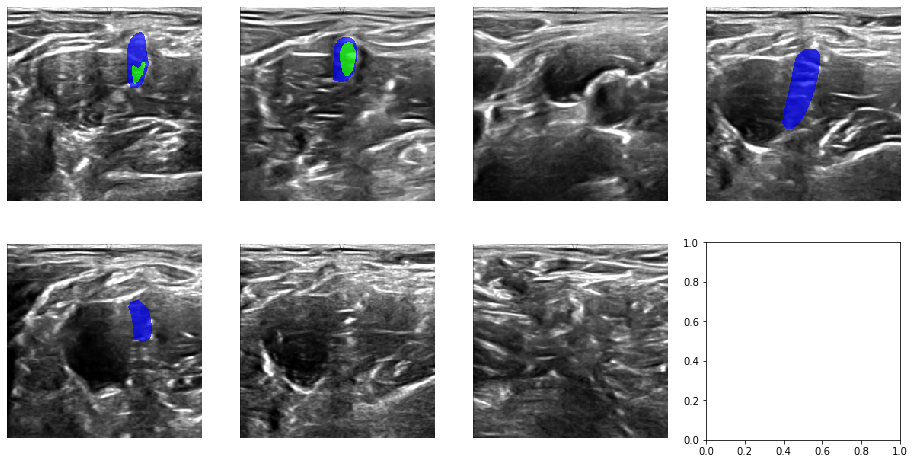


122000 images processed, loss = 0.01850864973725501
Validation loss = 0.02606715844051667
Val Dice score = 0.6415250897407532

124000 images processed, loss = 0.019183183996006846
Validation loss = 0.026839105583391525
Val Dice score = 0.6263442039489746

After 25 epochs: loss = 0.00027547996600674104
Validation loss = 0.026658699622312453
Val Dice score = 0.6684440970420837


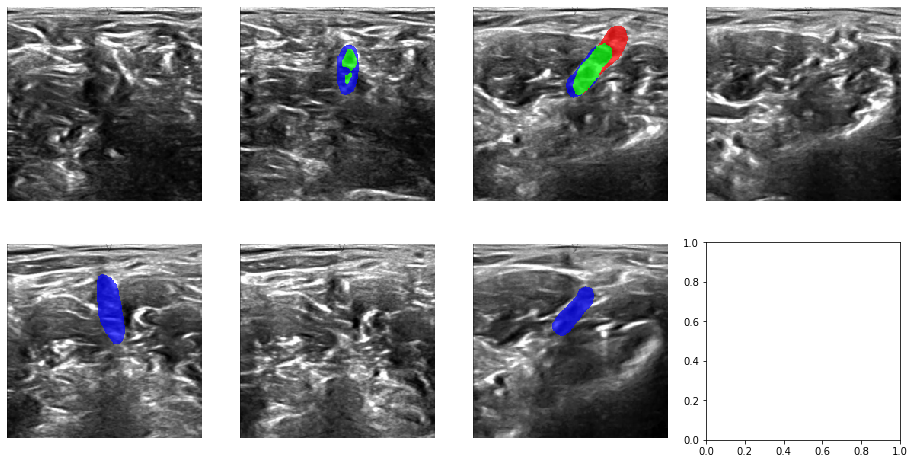


126004 images processed, loss = 0.018376899979815273
Validation loss = 0.026012433070894674
Val Dice score = 0.6549903750419617

128004 images processed, loss = 0.017895266463048756
Validation loss = 0.02742162662152456
Val Dice score = 0.6189737319946289

130004 images processed, loss = 0.0186783456094563
Validation loss = 0.027707517613502895
Val Dice score = 0.6564745306968689

After 26 epochs: loss = 0.00013191800719814328
Validation loss = 0.0267140425007809
Val Dice score = 0.6672170758247375


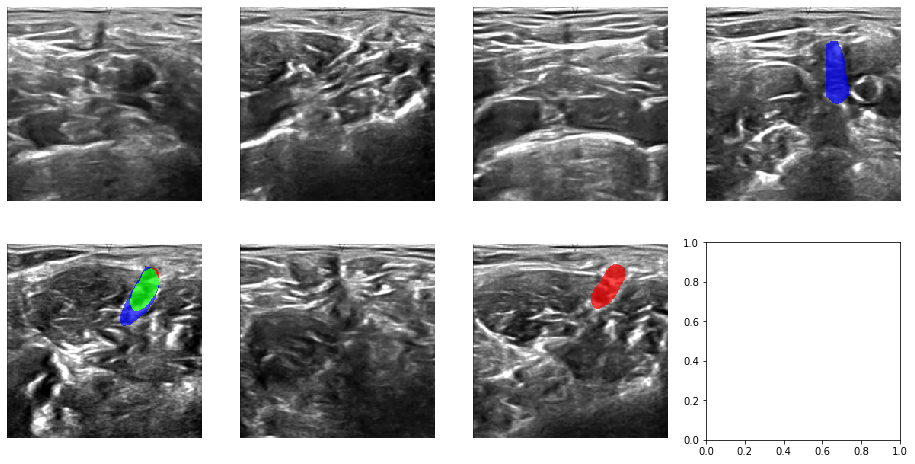


132000 images processed, loss = 0.017829975000356803
Validation loss = 0.02909068490855881
Val Dice score = 0.6171999573707581

134000 images processed, loss = 0.018210227789357304
Validation loss = 0.029468078166246414
Val Dice score = 0.6392775177955627

After 27 epochs: loss = 0.0002698788823862294
Validation loss = 0.027996646398942737
Val Dice score = 0.6384467482566833


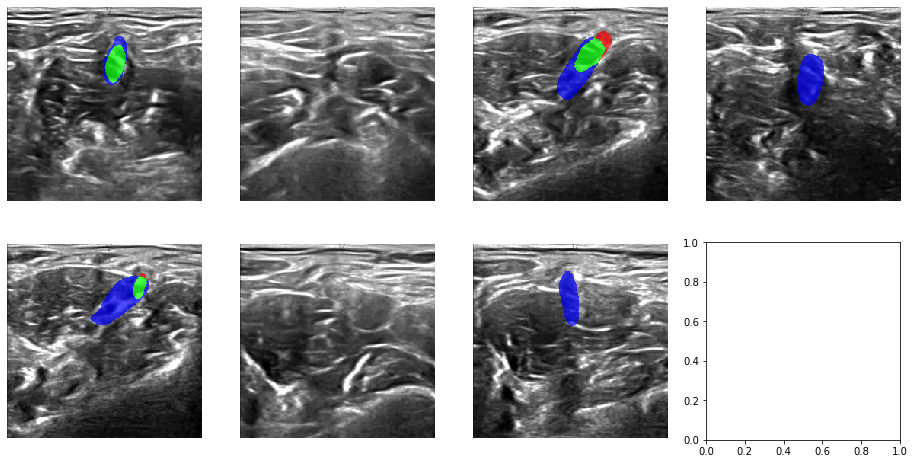


136004 images processed, loss = 0.01856060975794485
Validation loss = 0.030099513295272953
Val Dice score = 0.632085919380188

138004 images processed, loss = 0.018166928766295314
Validation loss = 0.02734005419173603
Val Dice score = 0.6371776461601257

140004 images processed, loss = 0.01820846758969128
Validation loss = 0.02898055155806629
Val Dice score = 0.6472947001457214

After 28 epochs: loss = 0.00012539703916543987
Validation loss = 0.026963952701781348
Val Dice score = 0.6240217685699463


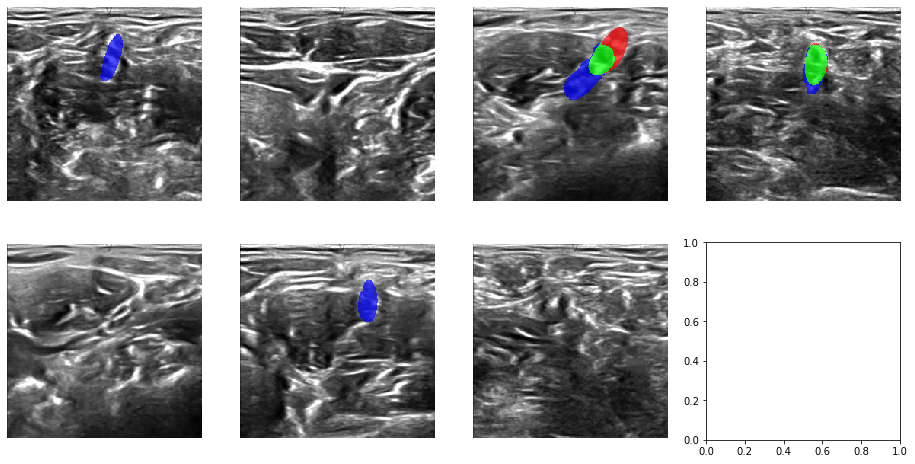


142000 images processed, loss = 0.017479824453764007
Validation loss = 0.028882236456271502
Val Dice score = 0.654432475566864

144000 images processed, loss = 0.017187901876866817
Validation loss = 0.02735886415886461
Val Dice score = 0.6429973840713501

146000 images processed, loss = 0.01784026174712926
Validation loss = 0.02677013633620361
Val Dice score = 0.6493580341339111

After 29 epochs: loss = 8.78840620406524e-06
Validation loss = 0.026594139984614514
Val Dice score = 0.6524481177330017


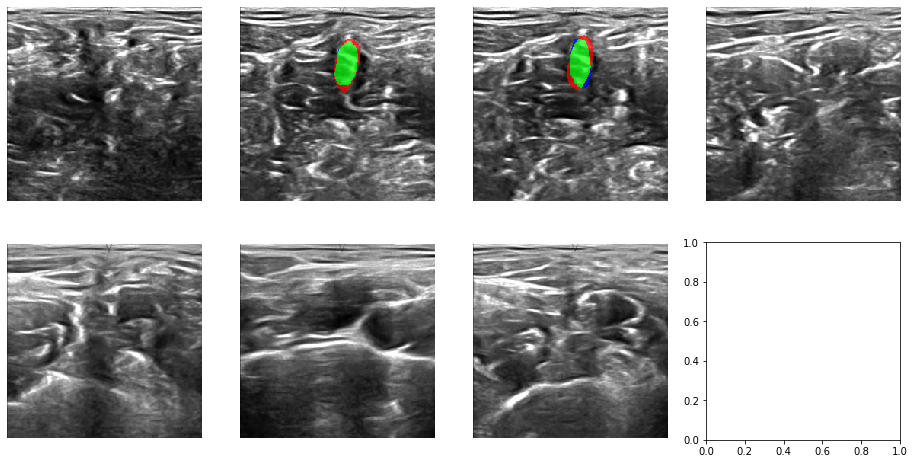


148004 images processed, loss = 0.018656504433416203
Validation loss = 0.027515286054207208
Val Dice score = 0.6427170634269714

150004 images processed, loss = 0.01746906152367592
Validation loss = 0.029442308168976455
Val Dice score = 0.6445474028587341

After 30 epochs: loss = 0.00011501058771898578
Validation loss = 0.027496210162610262
Val Dice score = 0.6617105603218079


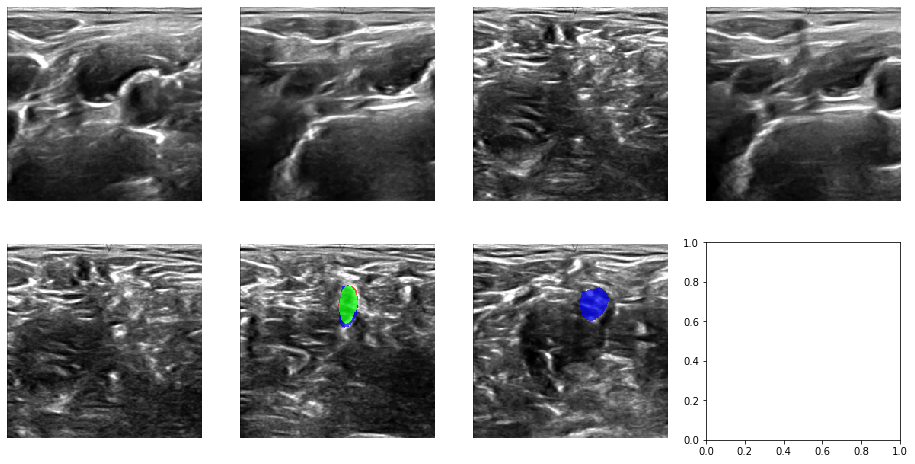


Best model dice: 0.6564745306968689
CPU times: user 38min 8s, sys: 8min 30s, total: 46min 38s
Wall time: 45min 43s


In [9]:
%%time

params_train = {
    'epochs': 30,
    'print_every': 2000,
    'lr': 0.001,
    'loss_type': 'cross_entropy'
}

detector.fit(loader_full_train, loader_full_val, **params_train)

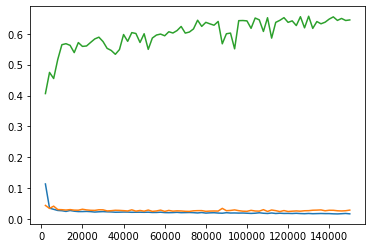

In [10]:
plt.plot(detector.n_samples, detector.loss_history,
         detector.n_samples, detector.val_loss_history,
         detector.n_samples, detector.dice_history);

Secondary training for Dice loss optimization

Optimization with dice loss function
2000 images processed, loss = 0.372793963432312
Validation loss = 0.383847071402061
Val Dice score = 0.6404168605804443

4000 images processed, loss = 0.36274945294857025
Validation loss = 0.3762763153033981
Val Dice score = 0.6282395124435425

After 1 epochs: loss = 0.07483697526979484
Validation loss = 0.3697066987197666
Val Dice score = 0.6006062030792236


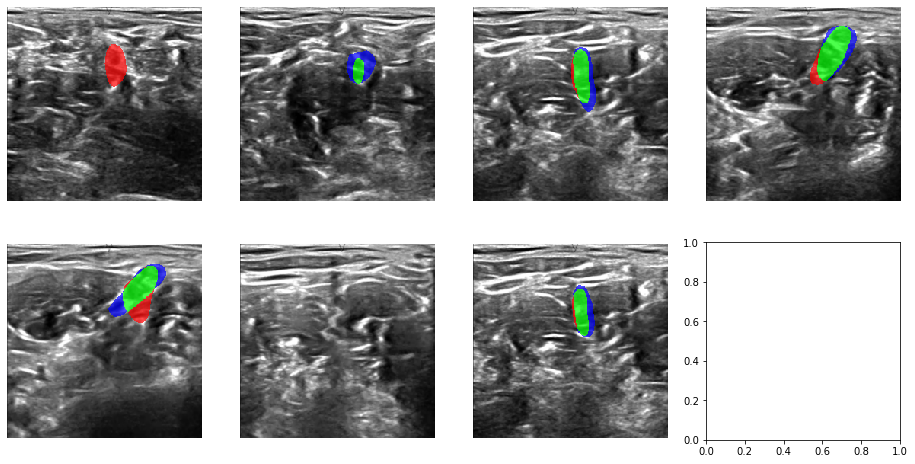


6004 images processed, loss = 0.36489213250592323
Validation loss = 0.3708047047381807
Val Dice score = 0.6041563749313354

8004 images processed, loss = 0.3553667743802071
Validation loss = 0.36384361275846455
Val Dice score = 0.5835607051849365

10004 images processed, loss = 0.35295672273635864
Validation loss = 0.3657235933564143
Val Dice score = 0.5834096074104309

After 2 epochs: loss = 0.002646313597040578
Validation loss = 0.36305129264352315
Val Dice score = 0.5774103999137878


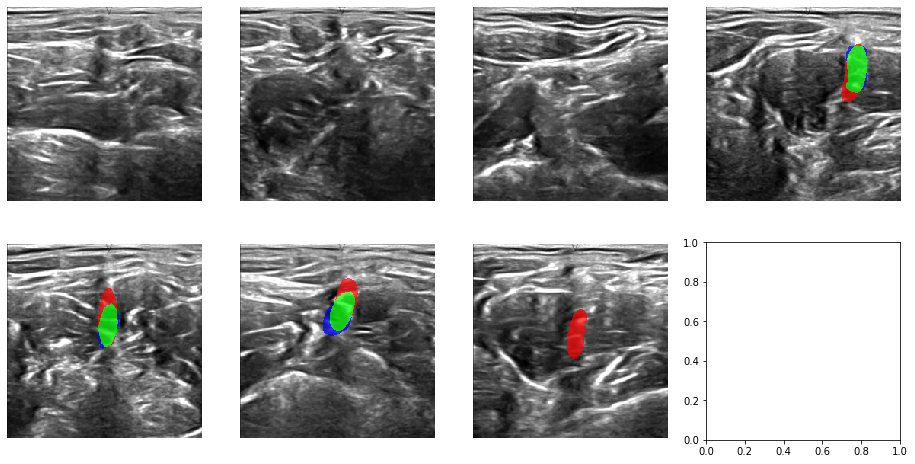


12000 images processed, loss = 0.3512371593343471
Validation loss = 0.3601102308558303
Val Dice score = 0.5658541917800903

14000 images processed, loss = 0.3537808074951172
Validation loss = 0.35815639119713455
Val Dice score = 0.5566467642784119

After 3 epochs: loss = 0.02595364567713981
Validation loss = 0.3557270595147733
Val Dice score = 0.541481614112854


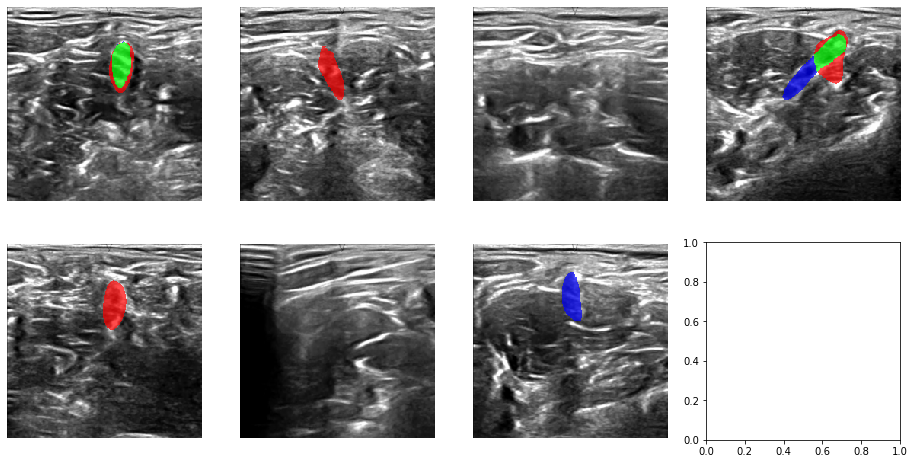


16004 images processed, loss = 0.3549970358074782
Validation loss = 0.35741220486781033
Val Dice score = 0.5583093166351318

18004 images processed, loss = 0.34337635451555254
Validation loss = 0.35343323993762465
Val Dice score = 0.5330197215080261

20004 images processed, loss = 0.35017757016420364
Validation loss = 0.3515123447313134
Val Dice score = 0.5263735055923462

After 4 epochs: loss = 0.0024370006429855554
Validation loss = 0.35155581661775237
Val Dice score = 0.5223126411437988


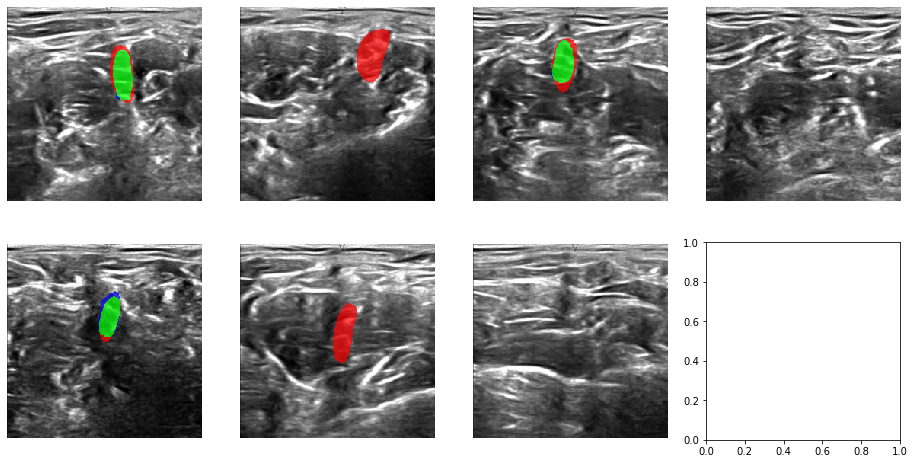


22000 images processed, loss = 0.3499098736083579
Validation loss = 0.3498341326223988
Val Dice score = 0.5128116607666016

24000 images processed, loss = 0.3435849991440773
Validation loss = 0.34937938988109263
Val Dice score = 0.5173906087875366

After 5 epochs: loss = 0.01606891219155764
Validation loss = 0.34820696413019464
Val Dice score = 0.5028523206710815


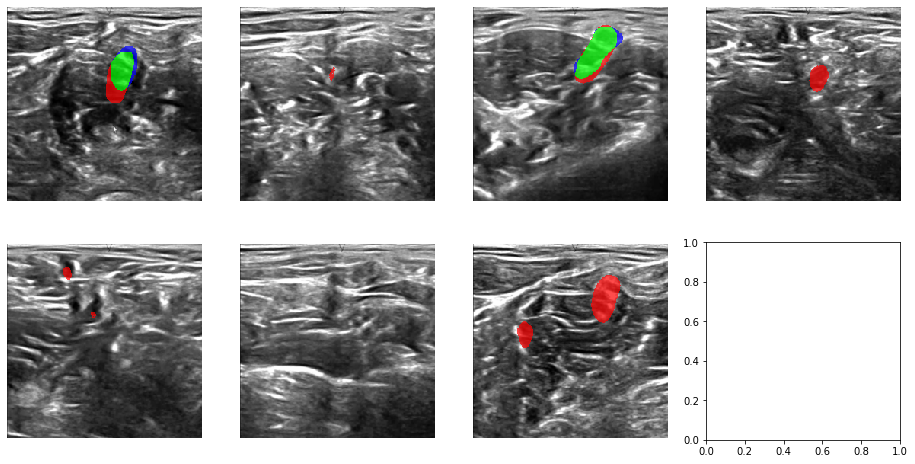


26004 images processed, loss = 0.3442354485422313
Validation loss = 0.3479172485400122
Val Dice score = 0.5042271018028259

28004 images processed, loss = 0.34482846689224245
Validation loss = 0.3461401950138837
Val Dice score = 0.49363577365875244

30004 images processed, loss = 0.33788295125961304
Validation loss = 0.3459979341503774
Val Dice score = 0.4817681908607483

After 6 epochs: loss = 0.0025205187241110123
Validation loss = 0.3462139116802279
Val Dice score = 0.486395001411438


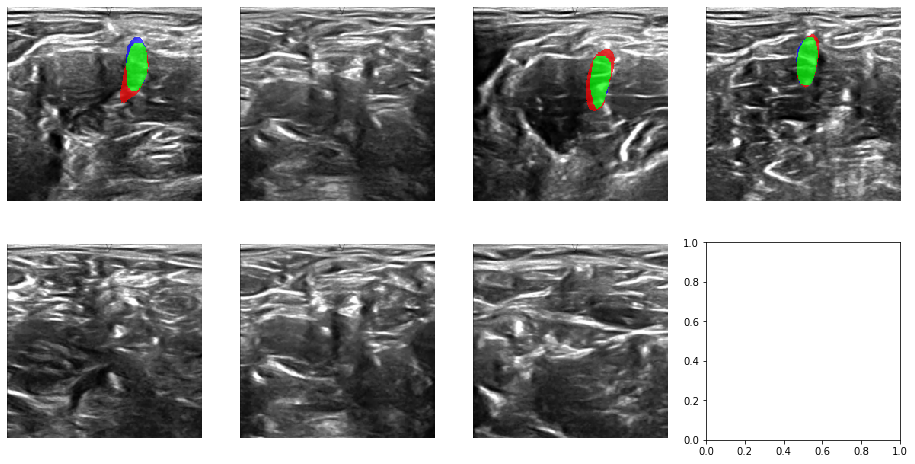


32000 images processed, loss = 0.3459428002337416
Validation loss = 0.34521840674451276
Val Dice score = 0.4835512042045593

34000 images processed, loss = 0.34020669186115265
Validation loss = 0.34435319059679226
Val Dice score = 0.4945482909679413

After 7 epochs: loss = 0.012042431628529578
Validation loss = 0.344828150755973
Val Dice score = 0.4963797628879547


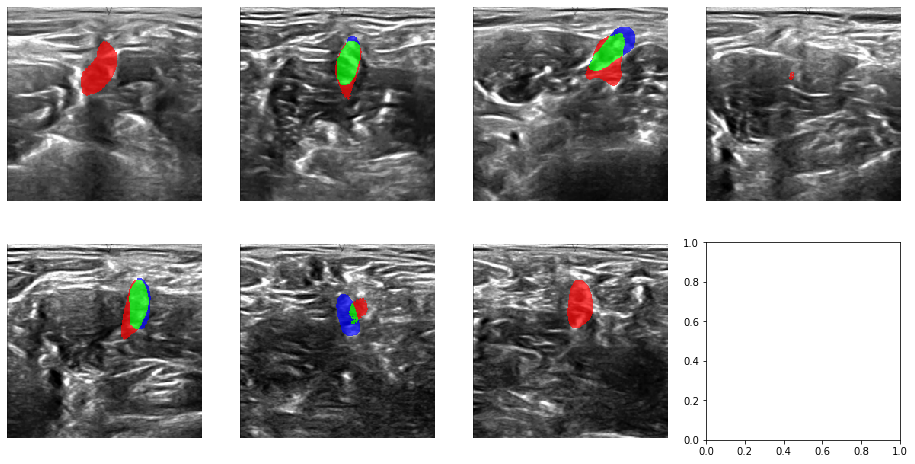


36004 images processed, loss = 0.3403748452603936
Validation loss = 0.3445593449776877
Val Dice score = 0.5035089254379272

38004 images processed, loss = 0.34021842330694196
Validation loss = 0.34373485957441824
Val Dice score = 0.5005995631217957

40004 images processed, loss = 0.3396581330895424
Validation loss = 0.3424969136913949
Val Dice score = 0.49335142970085144

After 8 epochs: loss = 0.0023579229915113653
Validation loss = 0.3428066626116509
Val Dice score = 0.4829418957233429


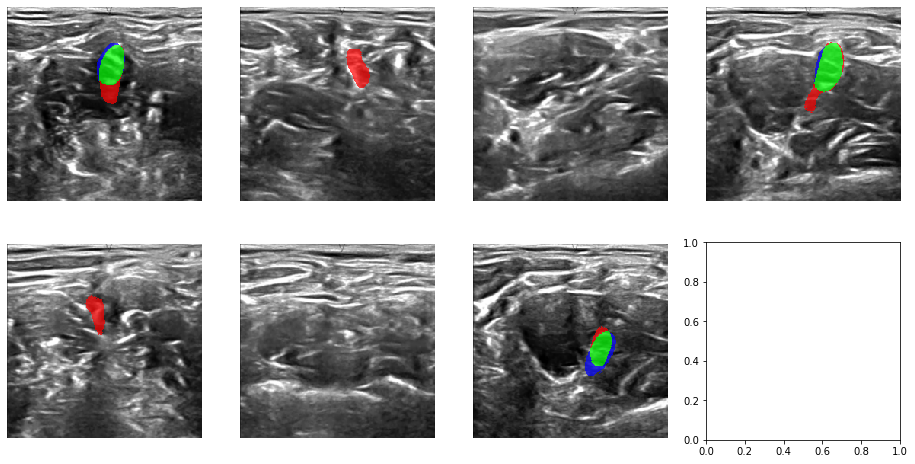


42000 images processed, loss = 0.34483568582362784
Validation loss = 0.34347387377129174
Val Dice score = 0.50506192445755

44000 images processed, loss = 0.33233746510744094
Validation loss = 0.34342397702158195
Val Dice score = 0.509597659111023

After 9 epochs: loss = 0.009951384769156397
Validation loss = 0.3440951407453254
Val Dice score = 0.5165306925773621


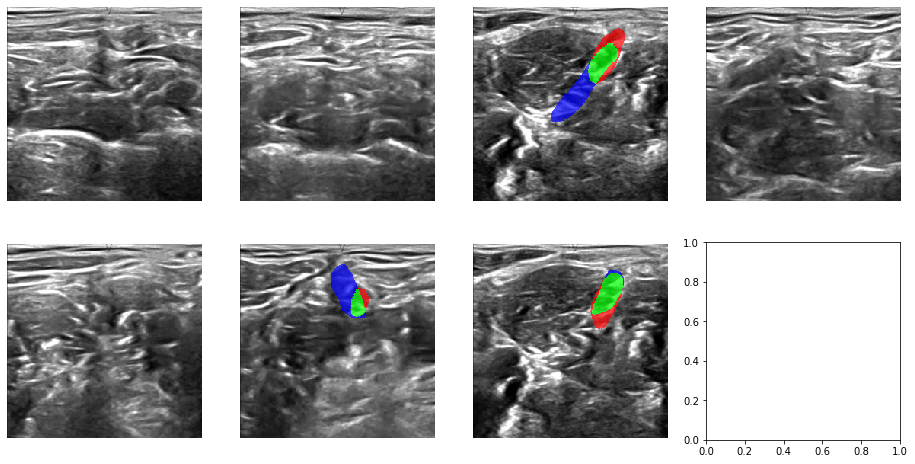


46004 images processed, loss = 0.3389879369331215
Validation loss = 0.34293458980192526
Val Dice score = 0.5033692717552185

48004 images processed, loss = 0.33710268092155454
Validation loss = 0.3429198986003315
Val Dice score = 0.5060713291168213

50004 images processed, loss = 0.3398697343468666
Validation loss = 0.341503443522923
Val Dice score = 0.49017930030822754

After 10 epochs: loss = 0.002497792317338933
Validation loss = 0.34210094142835806
Val Dice score = 0.4956003725528717


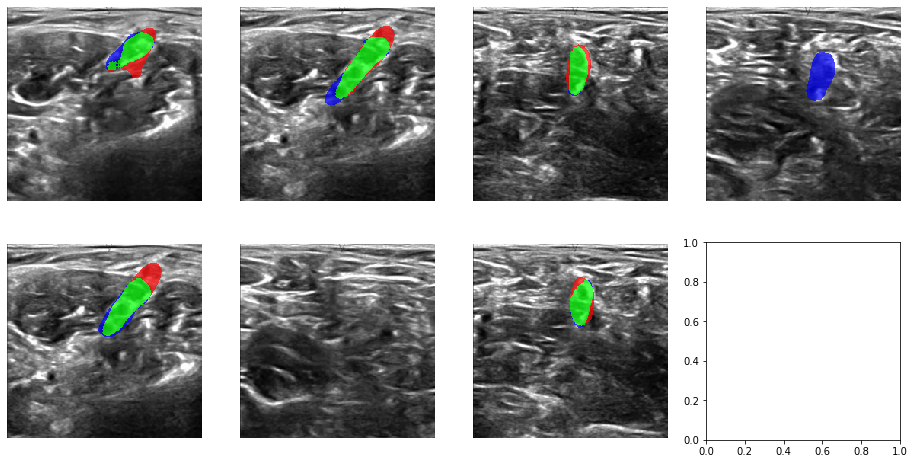


Best model dice: 0.6564745306968689
CPU times: user 12min 41s, sys: 2min 45s, total: 15min 27s
Wall time: 15min 8s


In [11]:
%%time

params_train = {
    'epochs': 10,
    'print_every': 2000,
    'lr': 1e-5,
    'loss_type': 'dice'
}

detector.fit(loader_full_train, loader_full_val, **params_train)

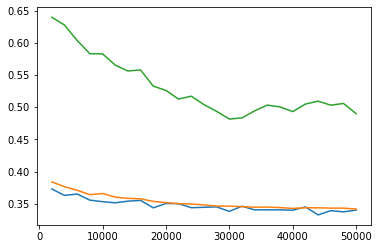

In [12]:
plt.plot(detector.n_samples, detector.loss_history,
         detector.n_samples, detector.val_loss_history,
         detector.n_samples, detector.dice_history);

In [14]:
detector.model.load_state_dict(detector.best_model_wts)

<All keys matched successfully>

In [9]:
torch.save(detector.model.state_dict(),
           os.path.join(MODEL_PATH, 'unet_v3_filters64_epochs20.pth'))

In [10]:
torch.save(detector.best_model_wts,
           os.path.join(MODEL_PATH, 'unet_v3_best_filters64_epochs20.pth'))

In [8]:
detector.model.load_state_dict(torch.load(os.path.join(MODEL_PATH, 'unet_v3_filters64_epochs20.pth')))

<All keys matched successfully>

## Binary classifier

### Old code

In [9]:
out_left = None
out_last = None

def leftout_hook(m, i, o):
    global out_left
    out_left = o

def lastout_hook(m, i, o):
    global out_last
    out_last = o

In [10]:
detector.model.dn_blk4.register_forward_hook(leftout_hook)
detector.model.up_blk4.register_forward_hook(lastout_hook)

In [27]:
x, y = iter(loader_val_full).next()
x = x.to(device)
y = y.to(device)

In [28]:
detector.model.eval()
with torch.no_grad():
    out_model = detector.model(x)

In [29]:
print(out_left.shape)
print(out_last.shape)

torch.Size([2, 512, 52, 72])
torch.Size([2, 64, 416, 576])


### New draft code

In [21]:
feat_gen_model = UnetDPart(**params_unet)
model_bin = BinClf(params_unet['n_filters'])

In [22]:
## load pretrained weights
feat_gen_model.load_state_dict(detector.best_model_wts, strict=False)

# Fix feature extracter parameters. We use it just as feature extractor
for param in feat_gen_model.parameters():
    param.require_grad = False

feat_gen_model.to(device)
feat_gen_model.eval()
model_bin.to(device)

BinClf(
  (conv8x8): Conv2d(512, 32, kernel_size=(8, 8), stride=(1, 1))
  (fc): Linear(in_features=32, out_features=1, bias=True)
)

In [23]:
def train(model, optimizer, dataloader_train, dataloader_val, epochs=1):
    loss_train_history = []
    loss_val_history = []
    accuracy_train_history = []
    accuracy_val_history = []
    
    loss_accum = 0
    num_images = 0
    accuracy_accum = 0
    for ee in range(epochs):
        for x, y in dataloader_train:
            model.train()
            x = x.to(device)
            target = y.flatten(start_dim=1).max(dim=1)[0]
            target = target.to(device)
            
            scores = model(feat_gen_model(x))
            scores.squeeze_()
            loss = F.binary_cross_entropy_with_logits(scores, target, reduction='sum')
            
            pred = scores.gt(0).float()
            
            loss_accum += loss.item()
            num_images += x.shape[0]
            accuracy_accum += torch.sum(pred * target + (1-pred) * (1-target))
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        loss_train_history.append(loss_accum / num_images)
        accuracy_train_history.append(accuracy_accum / num_images)
        loss_accum = 0
        num_images = 0
        accuracy_accum = 0
            
        print(f'After {ee+1} epochs: loss = {loss_train_history[-1]}, acc = {accuracy_train_history[-1]}')
        ## validation
        for x, y in dataloader_val:
            model.eval()
            x = x.to(device)
            target = y.flatten(start_dim=1).max(dim=1)[0]
            target = target.to(device)
            
            scores = model(feat_gen_model(x))
            scores.squeeze_()
            loss = F.binary_cross_entropy_with_logits(scores, target, reduction='sum')
            
            pred = scores.gt(0).float()
            
            loss_accum += loss.item()
            num_images += x.shape[0]
            accuracy_accum += torch.sum(pred * target + (1-pred) * (1-target))
            
        loss_val_history.append(loss_accum / num_images)
        accuracy_val_history.append(accuracy_accum / num_images)
        loss_accum = 0
        num_images = 0
        accuracy_accum = 0
        print(f'Validation loss = {loss_val_history[-1]}, acc = {accuracy_val_history[-1]}')
        
    plt.plot(range(epochs), loss_train_history,
             range(epochs), loss_val_history,
             range(epochs), accuracy_train_history,
             range(epochs), accuracy_val_history)
        

After 1 epochs: loss = 0.6054855092851011, acc = 0.7146545052528381
Validation loss = 0.5764621796711459, acc = 0.6894824504852295
After 2 epochs: loss = 0.4972132990126386, acc = 0.7652899026870728
Validation loss = 0.6950771943953679, acc = 0.6176961660385132
After 3 epochs: loss = 0.4682720319158601, acc = 0.7831612825393677
Validation loss = 0.5696389078098864, acc = 0.7245408892631531
After 4 epochs: loss = 0.44868558781359097, acc = 0.8012311458587646
Validation loss = 0.5936606519409332, acc = 0.6594323515892029
After 5 epochs: loss = 0.4442823881415075, acc = 0.7891183495521545
Validation loss = 0.6229315711580254, acc = 0.6544240117073059
After 6 epochs: loss = 0.44408300201792483, acc = 0.7966640591621399
Validation loss = 0.5726363654924752, acc = 0.6994991302490234
After 7 epochs: loss = 0.4318161194432435, acc = 0.8016282916069031
Validation loss = 0.5650816234403938, acc = 0.7195325493812561
After 8 epochs: loss = 0.43278137663700356, acc = 0.7992454767227173
Validation l

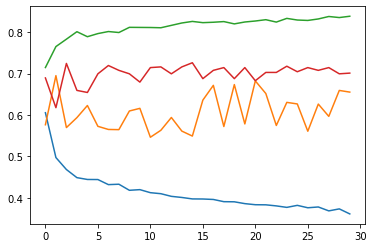

In [24]:
%%time

optimizer = optim.Adam(model_bin.parameters(), lr=0.001)
train(model_bin, optimizer, loader_full_train, loader_full_val, epochs=30)

## Submission

In [17]:
testset = USNSDataset(TEST_PATH, train=False, transform=transform_val)
loader_test = DataLoader(
    testset,
    batch_size=params['batch_size'],
    num_workers=6,
    pin_memory=True
)

In [18]:
%%time
fname = datetime.now().strftime('%Y%m%d_%H%M%S') + '.csv'
subms_path = os.path.join(SUBMS_PATH, fname)
detector.generate_submission(loader_test, subms_path)

CPU times: user 49.9 s, sys: 984 ms, total: 50.9 s
Wall time: 23.8 s


## Draft

In [36]:
x, y = iter(loader_labeled_val).next()

In [188]:
snap = TF.normalize(x[0], (-img_mean[0]/img_std[0],), (1/img_std[0],))[0]
targ = y[0, 0]
pred = y[5, 0]

In [189]:
snap = TF.to_pil_image(snap, mode='L')
targ = TF.to_pil_image(targ, mode='L')
pred = TF.to_pil_image(pred, mode='L')

In [190]:
zero = Image.new('L', (256, 256))

In [191]:
mask = Image.merge('RGB', (zero, targ, pred))

In [192]:
snap = snap.convert("RGB")

In [193]:
alpha = Image.composite(pred, targ, pred)

In [194]:
snap.paste(mask, None, alpha.point(lambda x: x//255*200))

In [51]:
imlist = compose_visualization(x, y, y1)

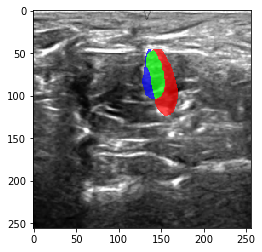

In [52]:
plt.imshow(imlist[7])